In [1]:
import glob
import pandas as pd
import numpy as np
import os
import re
import matplotlib.pyplot as plt
import math
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline

In [2]:
unc_folder = "/work/westgroup/ChrisB/_01_MeOH_repos/uncertainty_analysis/"
conda_path = unc_folder + "conda/"
RMG_base_folder = unc_folder + "RMG-Py/"
RMG_db_folder = unc_folder + "RMG-database/"
conda_path = unc_folder + "conda/"
expt_yaml_file = ""
output_path  = "/scratch/blais.ch/methanol_results_2022_05_09/"

In [4]:
# obj_func_filename = "objective_function_log_ct_analysis_artol.txt"
obj_func_filename = "objective_function_log2.txt"

In [5]:
obj_func_files = glob.glob(os.path.join(output_path,f"run_*/cantera/{obj_func_filename}"))

In [6]:
len(obj_func_files)

1899

In [7]:
obj_func_dict = {}
model_size_dict = {}
pattern = re.compile('run_+\d')
for file in obj_func_files:
    with open(file, "r") as f:
        line = f.readline()
        path,obj_func = line.split(":")
        
        # find the string for the run number 
        pattern = re.compile('run_\d{4}')
        match = re.search('run_\d{4}',file)
        run_num = int(match.group(0).replace('run_', ""))
        
        obj_func_dict[run_num] = float(obj_func)
        
    # access log file to get number fo species    
    new_addr = file.replace(f"cantera/{obj_func_filename}", "RMG.log")
    with open(new_addr, "r") as f:
        for line in f.readlines():
            if re.search('The final model core has', line, re.I):
                match_spec = re.search('[0-9]+ species',line)
                spec_num = int(match_spec.group(0).replace(" species", ""))
                
                match_reac = re.search('[0-9]+ reactions',line)
                reac_num = int(match_reac.group(0).replace(" reactions", ""))

                model_size_dict[run_num] = (spec_num,reac_num)
                
low_obj_func_dict = {}
low_model_size_dict = {}
for key, value in obj_func_dict.items(): 
    if value <= 1000.0 and value >= -1000.0:# or value >= 294:
        low_obj_func_dict[key] = value
        low_model_size_dict[key] = model_size_dict[key]

In [8]:
len(obj_func_dict)

1899

In [7]:
# plot the species and reaction vs the objective function
obj_list = []
spec_list = []
reac_list = []
for expt, size in model_size_dict.items():
    obj_list.append(obj_func_dict[expt])
    spec_list.append(model_size_dict[expt][0])
    reac_list.append(model_size_dict[expt][1])

fig, ax = plt.subplots()
plt.scatter(spec_list,obj_list)
# plt.yscale('log')
plt.title('# of species vs objective function')
plt.show()

plt.scatter(reac_list,obj_list, alpha=0.3)
# plt.yscale('log')
plt.title('# of reactions vs objective function')



NameError: name 'model_size_dict' is not defined

load pickle file 

In [10]:
import pickle
sobol_map = []
pickle_file =  output_path + 'sobol_map.pickle' 
with open(pickle_file, "rb") as file:
    sobol_map = pickle.load(file)

sobol_map_copy = sobol_map 
for key, perts in sobol_map.items():
    sobol_map[key] = perts[1].tolist()
    
df = pd.DataFrame.from_dict(sobol_map)

In [11]:
df

,Surface_Abstraction/Abstracting;Donating/alpha,Surface_Abstraction/Abstracting;Donating/A,Surface_Abstraction/Abstracting;Donating/E0,Surface_Abstraction/Abstracting;*R-H/alpha,Surface_Abstraction/Abstracting;*R-H/A,Surface_Abstraction/Abstracting;*R-H/E0,Surface_Abstraction/O;*C-H/alpha,Surface_Abstraction/O;*C-H/A,Surface_Abstraction/O;*C-H/E0,Surface_Abstraction/O;*OH/alpha,...,CPOX_Pt/Deutschmann2006_adjusted/30/H2OX + OX <=> HOX + HOX/A,CPOX_Pt/Deutschmann2006_adjusted/31/H2 + CX <=> CH2X/Ea,CPOX_Pt/Deutschmann2006_adjusted/31/H2 + CX <=> CH2X/A,CPOX_Pt/Deutschmann2006_adjusted/34/CH3X + HX <=> CH4 + Pt + Pt/Ea,CPOX_Pt/Deutschmann2006_adjusted/34/CH3X + HX <=> CH4 + Pt + Pt/A,H_BE,O_BE,C_BE,N_BE,vdw_BE
0,0.346619,1.572045e+18,119910.015625,0.249934,1.053947e+18,75410.359375,0.900370,7.649497e+17,108183.187500,0.743184,...,6.563195e+16,18388.765625,0.962972,37284.324219,1.283180e+17,-7314.718750,3680.177734,-14022.300781,-24450.882812,11438.024414
1,0.285948,7.389762e+16,107835.187500,0.384100,3.215041e+17,122115.570312,0.831074,9.159623e+16,150467.578125,0.722984,...,3.015481e+15,3548.187500,0.513056,27479.652344,5.925124e+17,5153.152344,23738.695312,22403.312500,3547.123047,7592.843750
2,0.392344,6.329954e+17,86686.671875,0.341041,2.530361e+17,86006.664062,0.999186,2.093759e+18,127465.648438,0.521888,...,2.652123e+16,55757.757812,0.102274,59995.484375,5.157154e+16,-29054.429688,-27532.902344,-17960.347656,-8439.210938,-2925.115234
3,0.409815,3.275967e+16,125052.671875,0.478446,6.797885e+17,97435.062500,1.077680,3.574025e+17,140348.281250,0.666592,...,3.352673e+16,34153.984375,0.335971,44685.375000,1.020164e+17,-17383.546875,-13300.914062,-25656.750000,14262.702148,16424.689453
4,0.232517,3.839545e+17,70153.828125,0.285386,1.654265e+17,121355.460938,0.908292,1.455856e+17,102434.242188,0.540734,...,3.660951e+15,25076.394531,0.810472,71591.328125,3.735989e+17,8467.501953,9596.201172,29603.673828,-5618.667969,-11756.998047
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.411136,5.515696e+16,104522.781250,0.446756,9.540812e+16,76503.343750,1.009326,1.133449e+18,102270.984375,0.626103,...,1.436820e+16,5049.480469,0.649063,57134.671875,1.358554e+17,15716.901367,-3344.050781,-13068.707031,-3145.984375,7299.647461
4996,0.229732,4.682367e+17,97436.875000,0.269503,1.302684e+18,112581.992188,0.839979,4.611716e+16,140273.390625,0.733723,...,1.755204e+15,54446.890625,0.247341,30133.542969,2.804077e+18,-10551.218750,7138.539062,8662.359375,8979.466797,-1967.244141
4997,0.327846,1.927582e+17,72004.390625,0.444695,3.973806e+17,85209.984375,0.892574,5.522135e+17,118379.296875,0.714098,...,3.822581e+16,42414.921875,0.291062,49394.246094,5.562419e+16,9328.775391,27317.904297,-15168.371094,-15292.507812,-18317.382812
4998,0.509822,2.106176e+18,123160.234375,0.319595,3.127537e+17,123192.960938,1.022077,1.262271e+17,156278.218750,0.530873,...,3.272933e+15,16814.109375,0.828036,66909.921875,6.463447e+17,-17290.828125,-23613.136719,19571.226562,24870.097656,13610.647461


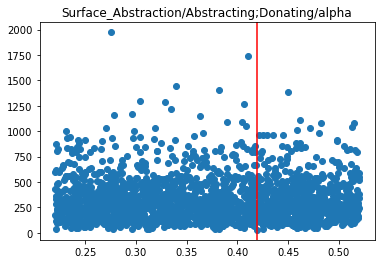

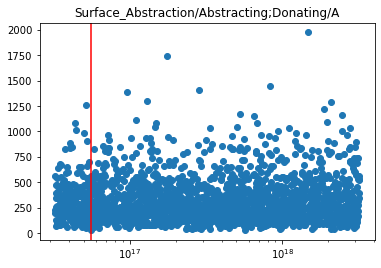

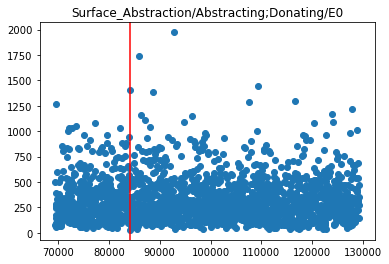

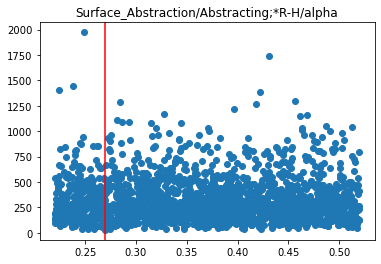

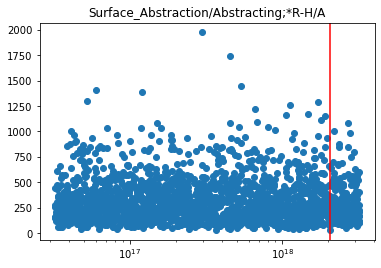

...

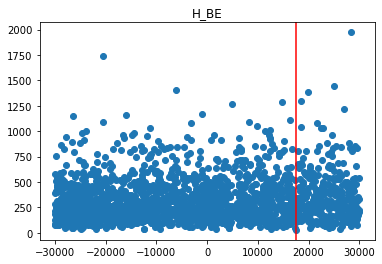

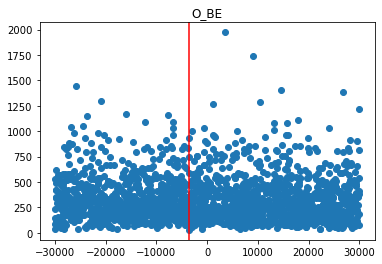

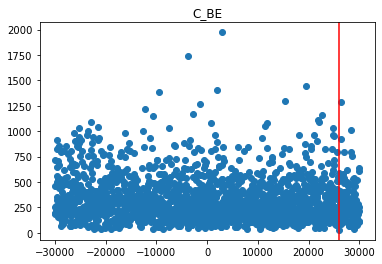

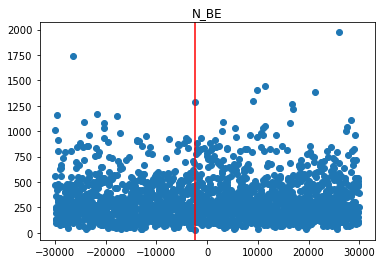

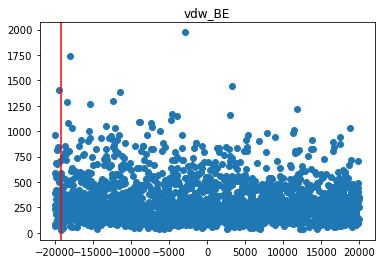

In [12]:
counter = 0
for col in df:
    counter += 1 
    obj_list = []
    val_list = []
    for run, obj in obj_func_dict.items():
        obj_list.append(obj)
#         obj_list.append(run)
        val_list.append(df[col][run])
#         val_list.append(obj)
        
    plt.scatter(val_list,obj_list)
    plt.title(col)
#     plt.yscale('log') 
    # get index of min obj function and make a vertical line
    min_obj = min((abs(x), x) for x in obj_list)[1] 
    min_index = obj_list.index(min_obj)
    plt.axvline(x=val_list[min_index], color = 'r')
    if col.endswith("/A") and max(val_list) > 1.0: 
        plt.xscale('log')
    plt.show()
#     if counter >=15:
#         break

In [13]:
# generate list of passed and failed runs
# get number of folders

total_run_folders = glob.glob(os.path.join(output_path,"run_*/"))
all_runs = list(range(0,len(total_run_folders)))

passed_runs = list(obj_func_dict.keys())
passed_runs.sort()
passed_runs

# use a set to get the difference between passed and failed runs 
failed_runs_set = set(all_runs).difference(passed_runs)
failed_runs = list(failed_runs_set)

In [14]:
print("passed: ", len(passed_runs), "\nfailed: ", len(failed_runs))

passed:  1899 
failed:  2813


In [15]:
float(np.log(10))

2.302585092994046

In [ ]:
# plot the passed vs failed runs number of species
counter = 0
for i,col in enumerate(df):
    counter += 1 
    failed_val_list = []
    passed_val_list = []
    for run in failed_runs:
        if col.endswith("/A") and min(df[col]) > 1:
            failed_val_list.append(math.log(df[col][run],10))
        else: 
            failed_val_list.append(df[col][run])
    for run in passed_runs:
        if col.endswith("/A") and min(df[col]) > 1:
            passed_val_list.append(math.log(df[col][run],10))
        else: 
            passed_val_list.append(df[col][run])
        
#         val_list.append(obj)

    plt.figure(i)   
    bw_adjust = 0.5
#     sns.kdeplot(np.array(failed_val_list), bw_adjust=bw_adjust, label = "failed")
#     sns.kdeplot(np.array(passed_val_list), bw_adjust=bw_adjust, label = "passed")
    sns.kdeplot(np.array(failed_val_list), bw_adjust=bw_adjust, label = "failed")
    sns.kdeplot(np.array(passed_val_list), bw_adjust=bw_adjust, label = "passed")
    plt.legend()
    plt.title(col)
#     if counter >=15:
#         break

/home/blais.ch/.conda/envs/rmg_julia_env/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


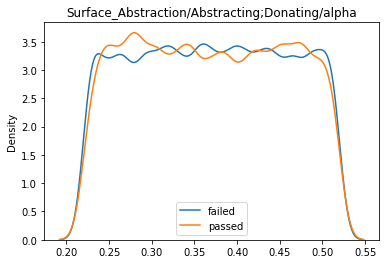

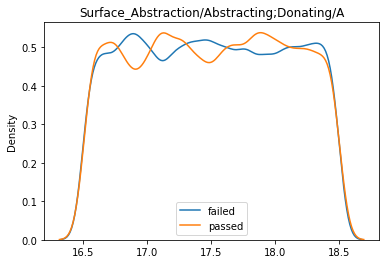

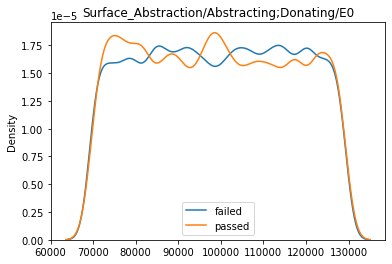

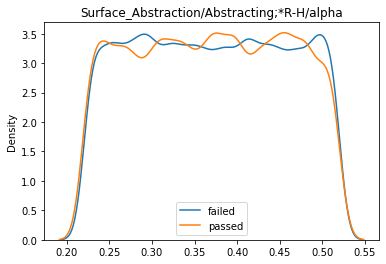

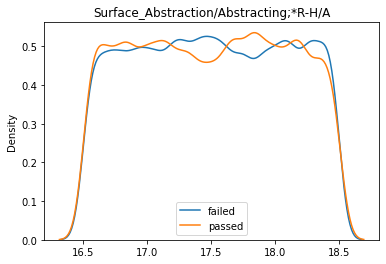

...

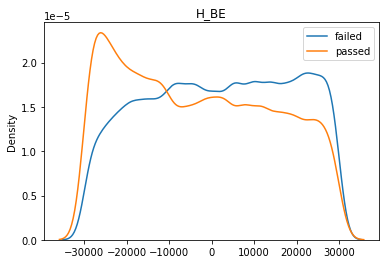

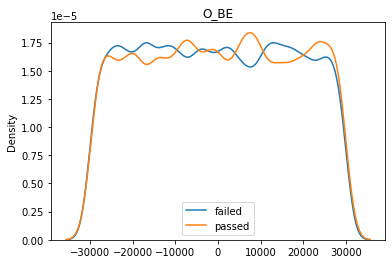

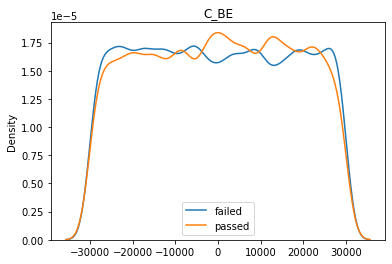

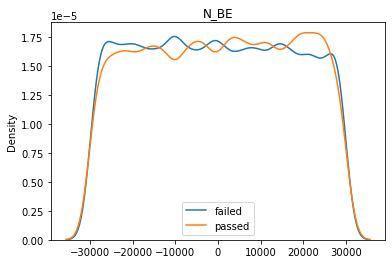

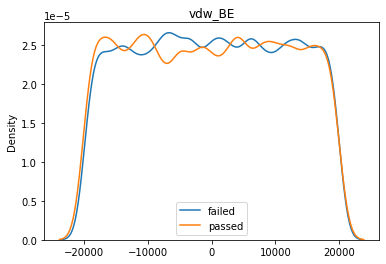

In [16]:
# plot the passed vs failed runs 
counter = 0
for i,col in enumerate(df):
    counter += 1 
    failed_val_list = []
    passed_val_list = []
    for run in failed_runs:
        if col.endswith("/A") and min(df[col]) > 1:
            failed_val_list.append(math.log(df[col][run],10))
        else: 
            failed_val_list.append(df[col][run])
    for run in passed_runs:
        if col.endswith("/A") and min(df[col]) > 1:
            passed_val_list.append(math.log(df[col][run],10))
        else: 
            passed_val_list.append(df[col][run])
        
#         val_list.append(obj)

    plt.figure(i)   
    bw_adjust = 0.5
#     sns.kdeplot(np.array(failed_val_list), bw_adjust=bw_adjust, label = "failed")
#     sns.kdeplot(np.array(passed_val_list), bw_adjust=bw_adjust, label = "passed")
    sns.kdeplot(np.array(failed_val_list), bw_adjust=bw_adjust, label = "failed")
    sns.kdeplot(np.array(passed_val_list), bw_adjust=bw_adjust, label = "passed")
    plt.legend()
    plt.title(col)
#     if counter >=15:
#         break

# get range of conditions where it doesn't fail, but also fails to make methanol/h2o. 

In [17]:
closest = min(obj_func_dict, key=lambda y: abs(obj_func_dict[y]))
print(closest,obj_func_dict[closest])

3171 27.677718974404243


# Analyze the model that fits best

In [4]:
# run_num = str(closest).zfill(4)
# model_path =  os.path.join(output_path,f"run_{run_num}")
model_path =  "/work/westgroup/ChrisB/_01_MeOH_repos/uncertainty_analysis/uncertainty_baseline"
csv_path = os.path.join(model_path, "cantera/ct_analysis.csv")

data_graaf = pd.read_csv(csv_path)
data_graaf = data_graaf[data_graaf["use_for_opt"] ==True]

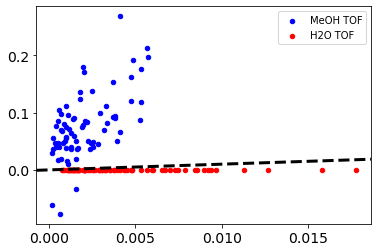

In [6]:
# ax = data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=True,color="b")
# ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",loglog=True,color="b")
# data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",loglog=True,color="r", ax=ax)
ax = data_graaf.plot.scatter("graaf H2O TOF 1/s","RMG H2O TOF 1/s",color="b")
data_graaf.plot.scatter("graaf MeOH TOF 1/s","RMG MeOH TOF 1/s",color="r", ax=ax)
# ax.set_ylim(1e-4, 1e-1)
# ax.set_xlim(1e-4, 1e-1)

ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.legend(labels=["MeOH TOF","H2O TOF"])

# make x=y line
# plt.gca().set_xlim(left=1e-4)
# plt.gca().set_ylim(bottom=1e-4)
xpoints = ypoints = plt.xlim()
plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=False, scaley=False)

In [21]:
data_all = pd.read_csv(csv_path)
data_grabow = data_all[data_all["experiment"] == "grabow2011"]
data_grabow.iloc[:, : 25]

,Unnamed: 0,experiment,use_for_opt,time (s),T (K),P (Pa),V (m^3/s),x_CO initial,x_CO2 initial,x_H2 initial,...,Atol,reactor type,energy on?,catalyst area,graaf MeOH TOF 1/s,graaf H2O TOF 1/s,RMG MeOH TOF 1/s,RMG H2O TOF 1/s,error squared MeOH TOF,error squared H2O TOF
216,216,grabow2011,False,16148.090534,528.0,7599300.0,0.000008,0.000000,0.200000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0457,5.500000e-02,0.002405,0.026141,0.897514,2.753206e-01
217,217,grabow2011,False,15686.791857,528.0,7599300.0,0.000008,0.020000,0.180000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0465,4.950000e-02,0.002441,0.023443,0.897781,2.770908e-01
218,218,grabow2011,False,15963.540329,528.0,7599300.0,0.000008,0.040000,0.160000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0472,4.430000e-02,0.002358,0.022033,0.902568,2.526458e-01
219,219,grabow2011,False,13304.120998,528.0,7599300.0,0.000008,0.060000,0.140000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0477,3.920000e-02,0.002256,0.020670,0.907657,2.234399e-01
220,220,grabow2011,False,13060.318142,528.0,7599300.0,0.000008,0.080000,0.120000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0488,3.460000e-02,0.002139,0.019150,0.914252,1.993782e-01
221,221,grabow2011,False,12781.020384,528.0,7599300.0,0.000008,0.100000,0.100000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0487,2.940000e-02,0.002006,0.017459,0.919296,1.649754e-01
222,222,grabow2011,False,13860.985749,528.0,7599300.0,0.000008,0.120000,0.080000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0488,2.420000e-02,0.001854,0.015552,0.925450,1.276950e-01
223,223,grabow2011,False,13862.317308,528.0,7599300.0,0.000008,0.140000,0.060000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0487,1.890000e-02,0.001679,0.013351,0.932243,8.620710e-02
224,224,grabow2011,False,15407.658734,528.0,7599300.0,0.000008,0.160000,0.040000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0484,1.340000e-02,0.001476,0.010776,0.939953,3.833929e-02
225,225,grabow2011,False,13259.387647,528.0,7599300.0,0.000008,0.180000,0.020000,0.800000,...,1.000000e-22,IdealGasReactor,off,44.424193,0.0478,7.380000e-03,0.001244,0.007660,0.948615,1.440334e-03


# get the highest rop pathway



In [22]:
# comparison 1: compare equ covs at 528 with grabow mechanism
# comparison 2: 

In [23]:
import os
from random import randint
import pandas as pd
import numpy as np
import csv
import cantera as ct
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline

import seaborn
plt.style.use('seaborn-white')
from pathlib import Path
import time

import matplotlib.cm as cm
from IPython.display import Image

import sys
# sys.path.append("~/_02_RMG_envs/RMG_julia_env/RMG-Py/rmgpy")
from rmgpy import chemkin

In [24]:
###############################################################################
# # plotting functions
###############################################################################
def plot_rates_grabow(df):
    '''
    This function returns a 2x2 set of charts like the ones above, 
    for comparison with the grabow rates and coverages. 
    df - dataframe to load
    labels - list of labels to use. first is the "x" values, then the y
    '''
    h2_mol = [0.5, 0.75, 0.8, 0.95]
    grabow_labels = [
        "Methanol Production",
        "Water-Gas Shift",
        "CO Hydrogenation",
        "CO2 Hydrogenation",
        "H2O Production",]
    
    h2_label = "y(H2)"
    co_co2_label = "CO2/(CO+CO2)"
    fig, ax = plt.subplots(2,2,figsize=(15,15))
    
    axes = [(0,0), (0,1), (1,0), (1,1)]
    
    color_dict = { 0:"k", 1:"y", 2:"g", 3:"b", 4:"r"}

    for coord,h2 in enumerate(h2_mol):
        
        for color,label in enumerate(grabow_labels):
            # "slot" where we place chart
            slot = axes[coord]
            df[np.isclose(df["y(H2)"], h2)].plot(x=co_co2_label,
                                                 y=label,
                                                 ax=ax[slot], 
                                                 color=color_dict[color],
                                                )
            ax[slot].set_title(f'mole frac H2 = {h2}')
            ax[slot].autoscale(enable=True, axis='y')
            ax[slot].set_ylabel("Turn over frequency ($s^{-1}$)")
    
    return fig

def plot_rates_rmg(df):
    '''
    This function returns a 2x2 set of charts like the ones above, 
    for comparison with the grabow rates and coverages. 
    df - dataframe to load
    labels - list of labels to use. first is the "x" values, then the y
    '''
    
    h2_mol = [0.5, 0.75, 0.8, 0.95]
    # this part is tricky. 
    
    #         "Methanol Production"  :  CH3O* + H* -> CH3OH* + *
    #         "Water-Gas Shift"      :  OH* + CO* -> COOH* + *
    #         "CO Hydrogenation"     :  CO* + H* -> HCO* + *
    #         "CO2 Hydrogenation"    :  CO2* + H* -> HCO2* + *
    #         "H2O Production"       :  #1 - #2
    #                                   #1:  H2O*+*->OH*+H*
    #                                   #2:  COOH* + OH* -> CO2* + H2O*
    rmg_labels = [
        "Methanol TOF ($s^{-1}$)",
        "WGS Reaction TOF ($s^{-1}$)",
        "CO Hydrogenation TOF ($s^{-1}$)",
        "CO2 Hydrogenation TOF ($s^{-1}$)",
        "H2O TOF ($s^{-1}$)",
    ]
        
    h2_label = "x_H2 initial"
    co_co2_label = "CO2/(CO2+CO)"
    color_dict = { 0:"k", 1:"y", 2:"g", 3:"b", 4:"r"}
    fig, ax = plt.subplots(2,2,figsize=(15,15))
    axes = [(0,0), (0,1), (1,0), (1,1)]

    for coord,h2 in enumerate(h2_mol):
        
        for color,label in enumerate(rmg_labels):
            # "slot" where we place chart
            slot = axes[coord]
            df[np.isclose(df[h2_label], h2)].plot(x=co_co2_label,
                                                 y=label,
                                                 ax =ax[slot], 
                                                 color=color_dict[color],
                                                )
            ax[slot].set_title(f'mole frac H2 = {h2}')
            ax[slot].autoscale(enable=True, axis='y')
            ax[slot].set_ylabel("Turn over frequency ($s^{-1}$)")
    
    return fig

def plot_covs_grabow(df):
    '''
    This function returns a 2x2 set of charts like the ones above, 
    for comparison with the rmg rates and coverages. 
    df - dataframe to load
    '''
    
    h2_mol = [0.5, 0.75, 0.8, 0.95]
    grabow_labels = [
        "vacant",
        "HCOO",
        "CH3O",
        "H",
        "OH",
    ]
    
    h2_label = "y(H2)"
    co_co2_label = "CO2/(CO+CO2)"
    fig, ax = plt.subplots(2,2,figsize=(15,15))
    
    axes = [(0,0), (0,1), (1,0), (1,1)]
    
    color_dict = { 0:"k", 1:"y", 2:"g", 3:"b", 4:"r"}

    for coord,h2 in enumerate(h2_mol):
        
        for color,label in enumerate(grabow_labels):
            # "slot" where we place chart
            slot = axes[coord]
            df[np.isclose(df["y(H2)"], h2)].plot(x=co_co2_label,
                                                 y=label,
                                                 ax=ax[slot], 
                                                 color=color_dict[color],
                                                )
            ax[slot].set_title(f'mole frac H2 = {h2}')
            ax[slot].autoscale(enable=True, axis='y')
            ax[slot].set_ylabel("site fraction")
            
    return fig

def plot_covs_rmg(df, labels, gas=False):
    '''
    This function returns a 2x2 set of charts like the ones above, 
    for comparison with the grabow rates and coverages. 
    df - dataframe to load
    labels - list of labels to use. first is the "x" values, then the y
    '''
    
    h2_mol = [0.5, 0.75, 0.8, 0.95]
    
    rmg_labels = labels
        
    h2_label = "x_H2 initial"
    co_co2_label = "CO2/(CO2+CO)"
    color_dict = { 0:"k", 1:"y", 2:"g", 3:"b", 4:"r", 5:"deeppink"}
    fig, ax = plt.subplots(2,2,figsize=(15,15))
    axes = [(0,0), (0,1), (1,0), (1,1)]

    for coord,h2 in enumerate(h2_mol):
        
        for color,label in enumerate(rmg_labels):
            # "slot" where we place chart
            slot = axes[coord]
            df[np.isclose(df[h2_label], h2)].plot(x=co_co2_label,
                                                 y=label,
                                                 ax =ax[slot], 
                                                 color=color_dict[color],
                                                )
            ax[slot].set_title(f'mole frac H2 = {h2}')
            ax[slot].autoscale(enable=True, axis='y')
            if gas: 
                ax[slot].set_ylabel("mole fraction")
            else: 
                ax[slot].set_ylabel("site fraction")
    return fig


def plot_parity(df, rmg_label, graaf_label):
    
    fig, ax = plt.subplots(1, 1)
    df.plot.scatter(graaf_label,rmg_label,loglog=True,color="b",ax=ax)
#     ax.set_ylim(1e-4, 1e-1)
#     ax.set_xlim(1e-4, 1e-1)

    ax.set_xlabel(graaf_label)
    ax.set_ylabel(rmg_label)
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    ax.legend(labels=["RMG model"])


#     # make x=y line
#     plt.gca().set_xlim(left=1e-5)
#     plt.gca().set_ylim(bottom=1e-5)
#     xpoints = ypoints = plt.xlim()
#     plt.plot(xpoints, ypoints, linestyle='--', color='k', lw=3, scalex=False, scaley=False)
    
    
    return fig


3171
CH3OH(8) + X(1) <=> CH3OH*(23) ROP [kmol/m^2 s] reverse
CH3OH(8) + 2 X(1) <=> CH3O*(21) + H*(10) ROP [kmol/m^2 s] reverse
CH3OH(8) + 2 X(1) <=> CH3OX(49) + H*(10) ROP [kmol/m^2 s] reverse
CH3OH(8) + 2 X(1) <=> CH3X(35) + OH*(12) ROP [kmol/m^2 s] reverse
CO2*(15) + H*(10) <=> COOH*(18) + X(1) forward
CO2*(15) + OH*(12) <=> COOH*(18) + O*(11) forward
COOH*(18) + OH*(12) <=> CO2*(15) + H2O*(13) forward
CO2*(15) + HCO*(16) <=> CO*(14) + COOH*(18) forward
COOH*(18) + HCOO*(17) <=> CO2*(15) + HCOOH*(19) forward
COOH*(18) + HCOO*(17) <=> CO2*(15) + HCOOH*(19) forward
2 COOH*(18) <=> CO2*(15) + HCOOH*(19) forward
COOH*(18) + HCO*(16) <=> CH2O*(20) + CO2*(15) forward
CH3O*(21) + COOH*(18) <=> CH3OH*(23) + CO2*(15) forward
COOH*(18) + HCOO*(17) <=> CO2*(15) + HCOOH*(19) forward
COOH*(18) + HCOO*(17) <=> CO2*(15) + HCOOH*(19) forward
CH3OX(49) + COOH*(18) <=> CH3OH*(23) + CO2*(15) forward
COOH*(18) + SX(59) <=> CO2*(15) + SX(62) forward
COOH*(18) + SX(77) <=> CO2*(15) + SX(110) forward
COOH*

/home/blais.ch/.conda/envs/rmg_julia_env/lib/python3.7/site-packages/ipykernel_launcher.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/blais.ch/.conda/envs/rmg_julia_env/lib/python3.7/site-packages/ipykernel_launcher.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/blais.ch/.conda/envs/rmg_julia_env/lib/python3.7/site-packages/ipykernel_launcher.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

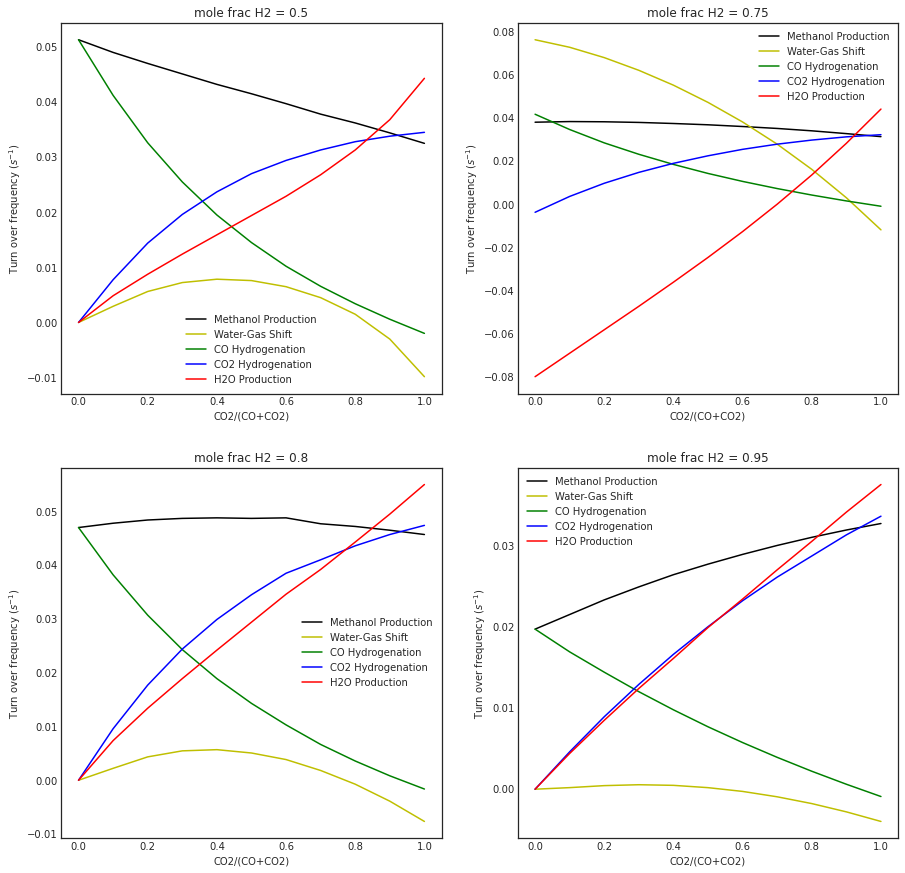

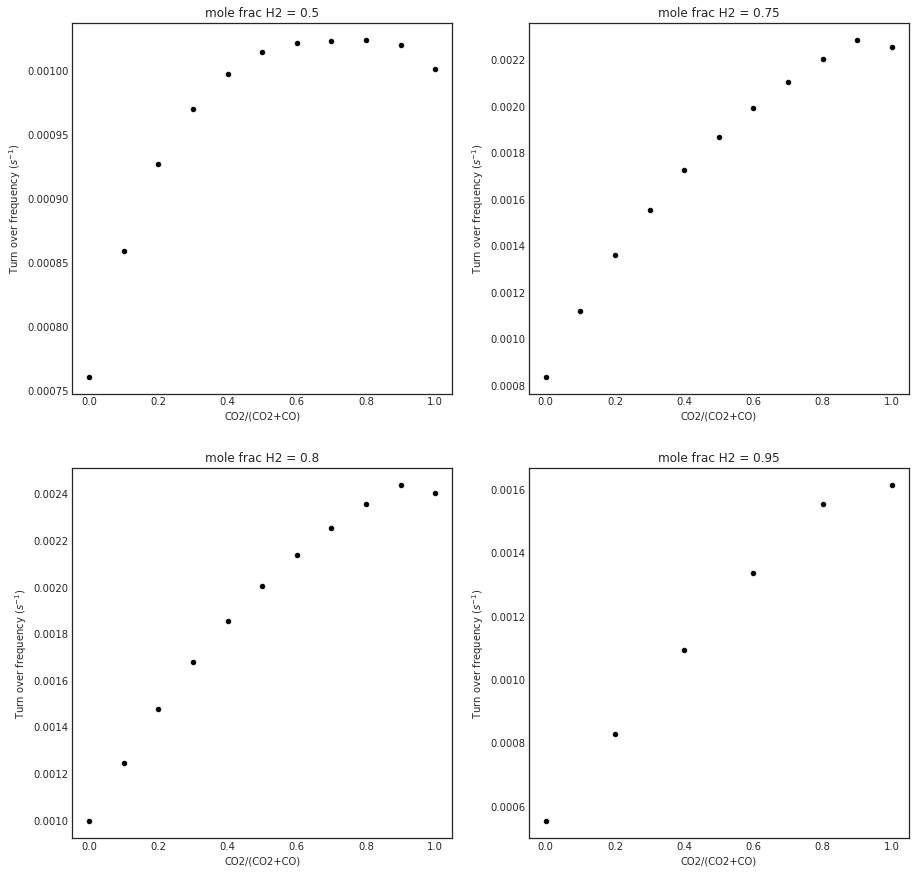

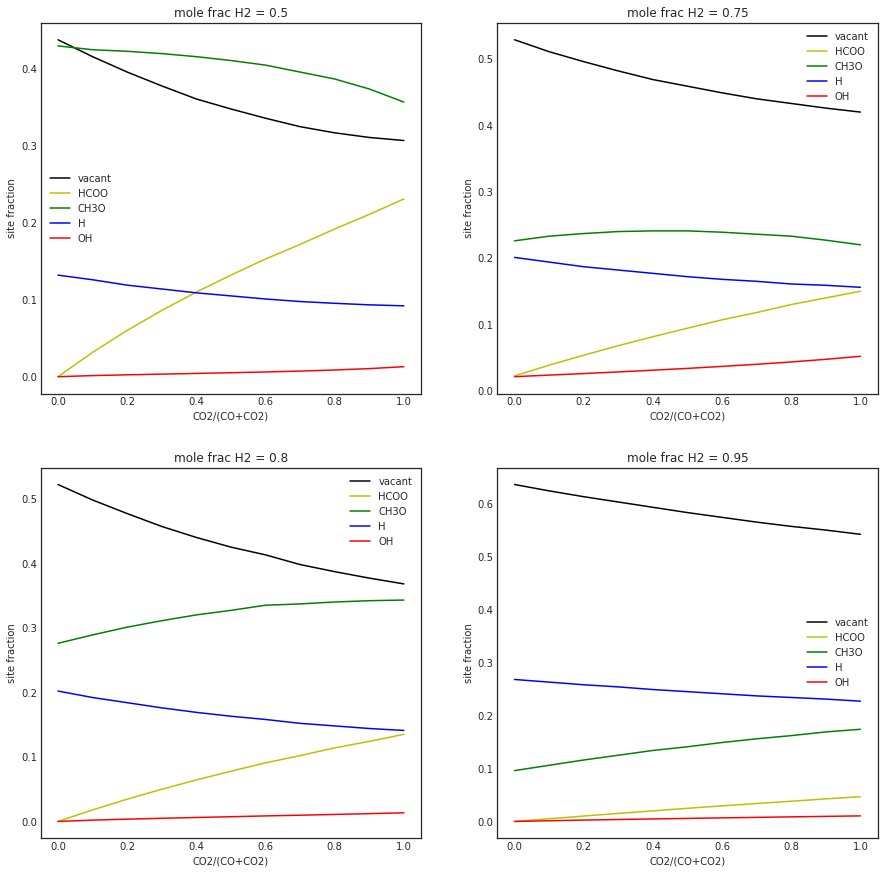

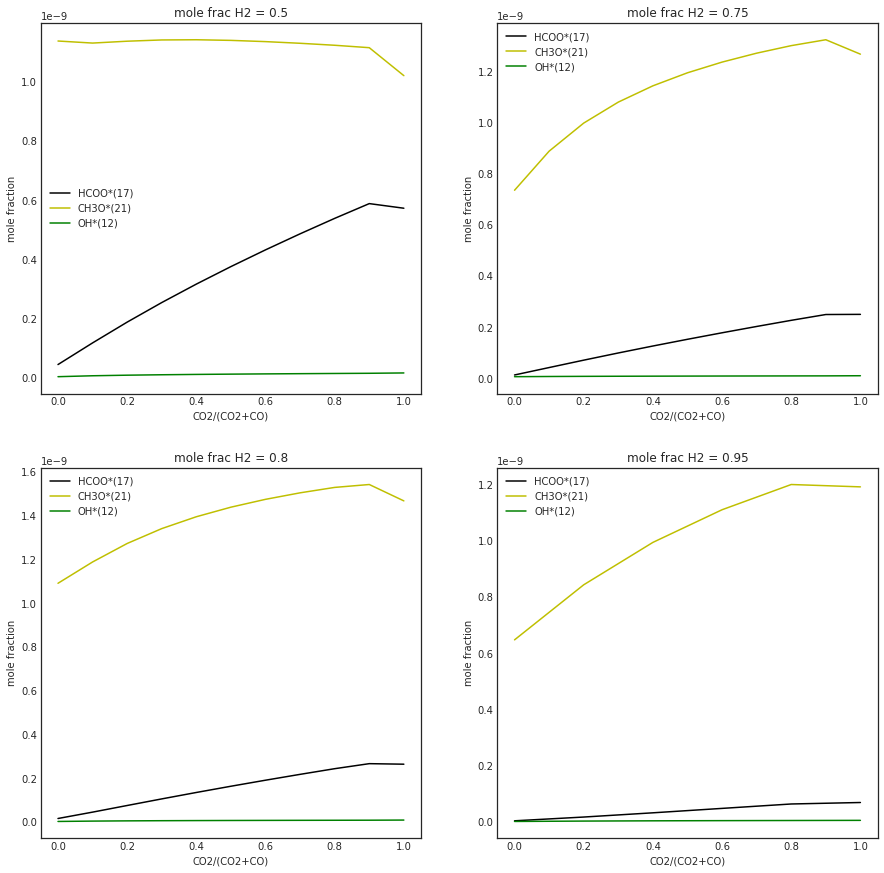

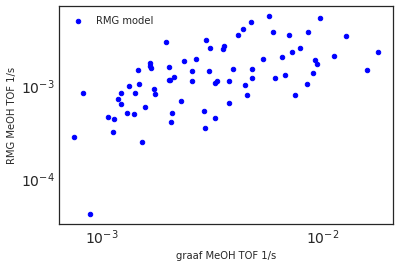

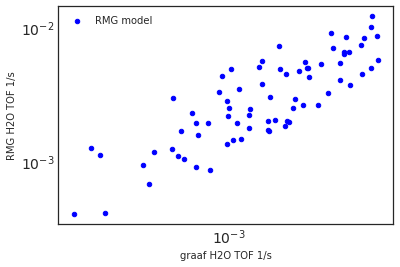

In [45]:
print(closest)

###############################################################################
# Plotting grabow data vs rmg data
###############################################################################
prefix = f'/scratch/blais.ch/methanol_results_2022_05_09/run_{closest}'
# prefix = '/work/westgroup/ChrisB/_01_MeOH_repos/meOH-synthesis/base'
# load file paths
rmg_model_path = f"{prefix}/"

cantera_path = rmg_model_path + "cantera/"
cti_file = cantera_path + "chem_annotated.cti"

gas = ct.Solution(cti_file)
surface = ct.Interface(cti_file, "surface1", [gas])

model_dict_file = rmg_model_path + "chemkin/species_dictionary.txt"
grabow_dict_file = "./species_data/species_dictionary.txt"

# create chemkin species_dicts
model_dict = chemkin.load_species_dictionary(model_dict_file)
grabow_dict = chemkin.load_species_dictionary(grabow_dict_file)

# make a dictionary to "translate" the names from the grabow model to ours
# irrespective of the naming convention.
spc_trans = {}
for name, entry in model_dict.items(): 
    for g_name, g_entry in grabow_dict.items():
        if entry.is_isomorphic(g_entry):
            # remove (#) so it is neater
            g_name_new = g_name.split("(", 1)[0]
            spc_trans.update({g_name_new :name})

# read in dataframe for run. split into grabow and graaf data
data_all = pd.read_csv(cantera_path+ "ct_analysis.csv")
data_graaf = data_all[data_all['experiment'] == "graaf_1988"]
data_grab = data_all[data_all['experiment'] == "grabow2011"]

# get what label is for co/co2 ratio column
co_co2_label = "CO2/(CO2+CO)"

# setup up the column label strings for rop
rop_str = " ROP [kmol/m^2 s]"     

# load in the TOFs for methanol
ch3oh_dict = {}  
        
for rxn in surface.reactions():
    if spc_trans["CH3OH"] in rxn.equation: 
        rxn_string = rxn.equation + rop_str
        if spc_trans["CH3OH"] in rxn.product_string:
            print(rxn_string, "forward")
            ch3oh_dict.update({rxn_string:1})
        elif spc_trans["CH3OH"] in rxn.reactant_string: 
            print(rxn_string, "reverse")
            ch3oh_dict.update({rxn_string:-1})

data_grab["Methanol TOF ($s^{-1}$)"] = 0 #(initialize)
for rxn, direct in ch3oh_dict.items():
    if direct == 1:
        data_grab["Methanol TOF ($s^{-1}$)"] += data_grab[rxn]/surface.site_density
    elif direct == -1:
        data_grab["Methanol TOF ($s^{-1}$)"] -= data_grab[rxn]/surface.site_density

# load in data for WGS rxn
wgs_hyd_dict = {}
for rxn in surface.reactions():
#     if spc_trans["CO*"] in rxn.reactant_string and spc_trans["OH*"] in rxn.reactant_string:
    if spc_trans["CO2*"] in rxn.reactant_string and spc_trans["COOH*"] in rxn.product_string:
        rxn_string = rxn.equation + rop_str
        print(rxn.equation, "forward")
        wgs_hyd_dict.update({rxn_string:-1})
    elif spc_trans["COOH*"] in rxn.reactant_string and spc_trans["CO2*"] in rxn.product_string:
        rxn_string = rxn.equation + rop_str
        print(rxn.equation, "forward")
        wgs_hyd_dict.update({rxn_string:1})

# # # hardcode HOX(19) + OCX(17) <=> HOCXO(23) + X(1) for now just to analyze
# wgs_hyd_dict.update(
#     {f'{spc_trans["CO*"]} + {spc_trans["OH*"]} <=> {spc_trans["COOH*"]} + {spc_trans["X"]}{rop_str}':1
# #     {f'{spc_trans["H2O*"]} + {spc_trans["X"]} <=> {spc_trans["H*"]} + {spc_trans["OH*"]}{rop_str}':1 
# #     {f'{spc_trans["CO*"]} + {spc_trans["OH*"]} <=> {spc_trans["COOH*"]} + {spc_trans["X"]}{rop_str}':1
#     }
# )

data_grab["WGS Reaction TOF ($s^{-1}$)"] = 0 #(initialize)
for rxn, direct in wgs_hyd_dict.items():
    if direct == 1:
        data_grab["WGS Reaction TOF ($s^{-1}$)"] += data_grab[rxn]/surface.site_density
    elif direct == -1:
        data_grab["WGS Reaction TOF ($s^{-1}$)"] -= data_grab[rxn]/surface.site_density


# load in CO hydrogenation data 
co_hyd_dict = {}
rop_str = " ROP [kmol/m^2 s]"
for rxn in surface.reactions():
    if spc_trans["CO*"] in rxn.equation and spc_trans["HCO*"] in rxn.equation: 
        rxn_string = rxn.equation + rop_str
        if spc_trans["CO*"] in rxn.reactant_string and not spc_trans["HCO*"] in rxn.reactant_string:
            print(rxn.equation, "forward")
            co_hyd_dict.update({rxn_string:1})
        elif spc_trans["CO*"] in rxn.product_string and not spc_trans["HCO*"] in rxn.product_string: 
            print(rxn.equation, "reverse")
            co_hyd_dict.update({rxn_string:-1})

data_grab["CO Hydrogenation TOF ($s^{-1}$)"] = 0 #(initialize)
for rxn, direct in co_hyd_dict.items():
    if direct == 1:
        data_grab["CO Hydrogenation TOF ($s^{-1}$)"] += data_grab[rxn]/surface.site_density
    elif direct == -1:
        data_grab["CO Hydrogenation TOF ($s^{-1}$)"] -= data_grab[rxn]/surface.site_density

# load in CO2 hydrogenation data
co2_hyd_dict = {}
for rxn in surface.reactions():
    if spc_trans["CO2*"] in rxn.equation and spc_trans["HCOO*"] in rxn.equation: 
        rxn_string = rxn.equation + rop_str
        if spc_trans["CO2*"] in rxn.reactant_string and not spc_trans["HCOO*"] in rxn.reactant_string:
            print(rxn.equation, "forward")
            co2_hyd_dict.update({rxn_string:1})
        elif spc_trans["CO2*"] in rxn.product_string and not spc_trans["HCOO*"] in rxn.product_string: 
            print(rxn.equation, "reverse")
            co2_hyd_dict.update({rxn_string:-1})
617-789-2102
data_grab["CO2 Hydrogenation TOF ($s^{-1}$)"] = 0 #(initialize)
for rxn, direct in co2_hyd_dict.items():
    if direct == 1:
        data_grab["CO2 Hydrogenation TOF ($s^{-1}$)"] += data_grab[rxn]/surface.site_density
    elif direct == -1:
        data_grab["CO2 Hydrogenation TOF ($s^{-1}$)"] -= data_grab[rxn]/surface.site_density

# load in H2O ROP data
h2o_dict = {}        
for rxn in surface.reactions():
    if spc_trans["H2O"] in rxn.equation: 
        rxn_string = rxn.equation + rop_str
        if spc_trans["H2O"] in rxn.reactant_string:
            print(rxn.equation, "reverse")
            h2o_dict.update({rxn_string:-1})
        elif spc_trans["H2O"] in rxn.product_string: 
            print(rxn.equation, "forward")
            h2o_dict.update({rxn_string:1}) 

data_grab["H2O TOF ($s^{-1}$)"] = 0 #(initialize)
for rxn, direct in h2o_dict.items():
    if direct == 1:
        data_grab["H2O TOF ($s^{-1}$)"] += data_grab[rxn]/surface.site_density
    elif direct == -1:
        data_grab["H2O TOF ($s^{-1}$)"] -= data_grab[rxn]/surface.site_density

# get surface site density on a molar basis (do we need this?)
surface.site_density
site_dens_mol = surface.site_density*1e-3
site_dens_mol

# load in grabow data
Grabow_rates = pd.read_csv("./experimental_data/grabow/Grabow_rates.csv")
Grabow_cov = pd.read_csv("./experimental_data/grabow/Grabow_coverages.csv")

# plot rates
fig_grab_rates = plot_rates_grabow(Grabow_rates)
fig_rmg_rates = plot_rates_rmg(data_grab[data_grab["T (K)"] == 528])

# plot coverages
fig_grab_cov = plot_covs_grabow(Grabow_cov)

labels = [
#     spc_trans["X"],
    spc_trans["HCOO*"],
    spc_trans["CH3O*"],
#     spc_trans["H*"],
    spc_trans["OH*"],
]
fig_rmg_cov = plot_covs_rmg(data_grab[data_grab["T (K)"] == 528], labels, gas=True)


# TOF plots
df_parity = data_graaf[data_graaf["use_for_opt"] == True]

graaf_meoh_label = "graaf MeOH TOF 1/s"
rmg_meoh_label = "RMG MeOH TOF 1/s"
graaf_h2o_label = "graaf H2O TOF 1/s"
rmg_h2o_label = "RMG H2O TOF 1/s"

fig_meoh_parity = plot_parity(df_parity, rmg_meoh_label, graaf_meoh_label)
fig_h2o_parity = plot_parity(df_parity, rmg_h2o_label, graaf_h2o_label)



# save figures in a report
pp = PdfPages('report.pdf')
pp.savefig(fig_grab_rates)
pp.savefig(fig_rmg_rates)
pp.savefig(fig_grab_cov)
pp.savefig(fig_rmg_cov)
pp.savefig(fig_meoh_parity)
pp.savefig(fig_h2o_parity)
pp.close()

In [26]:
# just plot meoh TOF vs CO/CO2 ratio

def plot_rates_rmg(df):
    '''
    This function returns a 2x2 set of charts like the ones above, 
    for comparison with the grabow rates and coverages. 
    df - dataframe to load
    labels - list of labels to use. first is the "x" values, then the y
    '''
    
    h2_mol = [0.5, 0.75, 0.8, 0.95]
    # this part is tricky. 
    
    #         "Methanol Production"  :  CH3O* + H* -> CH3OH* + *
    #         "Water-Gas Shift"      :  OH* + CO* -> COOH* + *
    #         "CO Hydrogenation"     :  CO* + H* -> HCO* + *
    #         "CO2 Hydrogenation"    :  CO2* + H* -> HCO2* + *
    #         "H2O Production"       :  #1 - #2
    #                                   #1:  H2O*+*->OH*+H*
    #                                   #2:  COOH* + OH* -> CO2* + H2O*
    rmg_labels = [
        "Methanol TOF ($s^{-1}$)",
#         "CH3OH(8) + X(1) <=> CH3OH*(23) ROP [kmol/m^2 s]"
#         "WGS Reaction TOF ($s^{-1}$)",
#         "CO Hydrogenation TOF ($s^{-1}$)",
#         "CO2 Hydrogenation TOF ($s^{-1}$)",
#         "H2O TOF ($s^{-1}$)",
    ]
        
    h2_label = "x_H2 initial"
    co_co2_label = "CO2/(CO2+CO)"
    color_dict = { 0:"k", 1:"y", 2:"g", 3:"b", 4:"r"}
    fig, ax = plt.subplots(2,2,figsize=(15,15))
    axes = [(0,0), (0,1), (1,0), (1,1)]

    for coord,h2 in enumerate(h2_mol):
        
        for color,label in enumerate(rmg_labels):
            # "slot" where we place chart
            slot = axes[coord]
            df[np.isclose(df[h2_label], h2)].plot(
                x=co_co2_label,
                y=label,
                ax =ax[slot], 
                color=color_dict[color],
                kind='scatter')
                                                
            ax[slot].set_title(f'mole frac H2 = {h2}')
            ax[slot].autoscale(enable=True, axis='y')
            ax[slot].set_ylabel("Turn over frequency ($s^{-1}$)")
    
    return fig

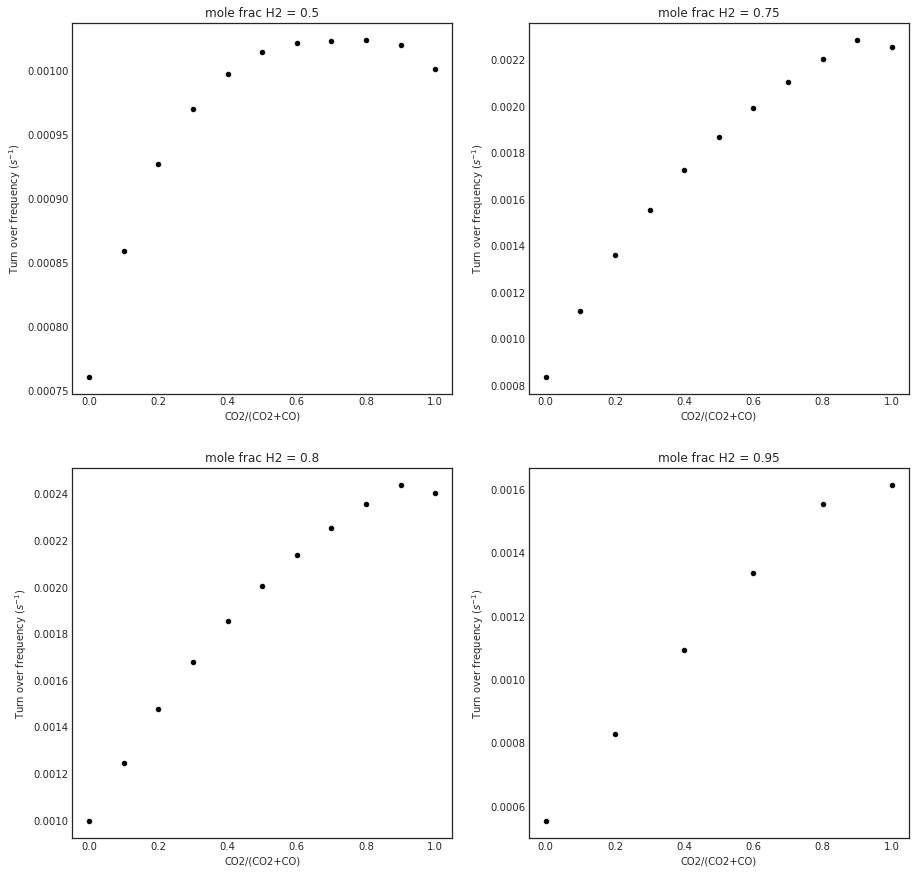

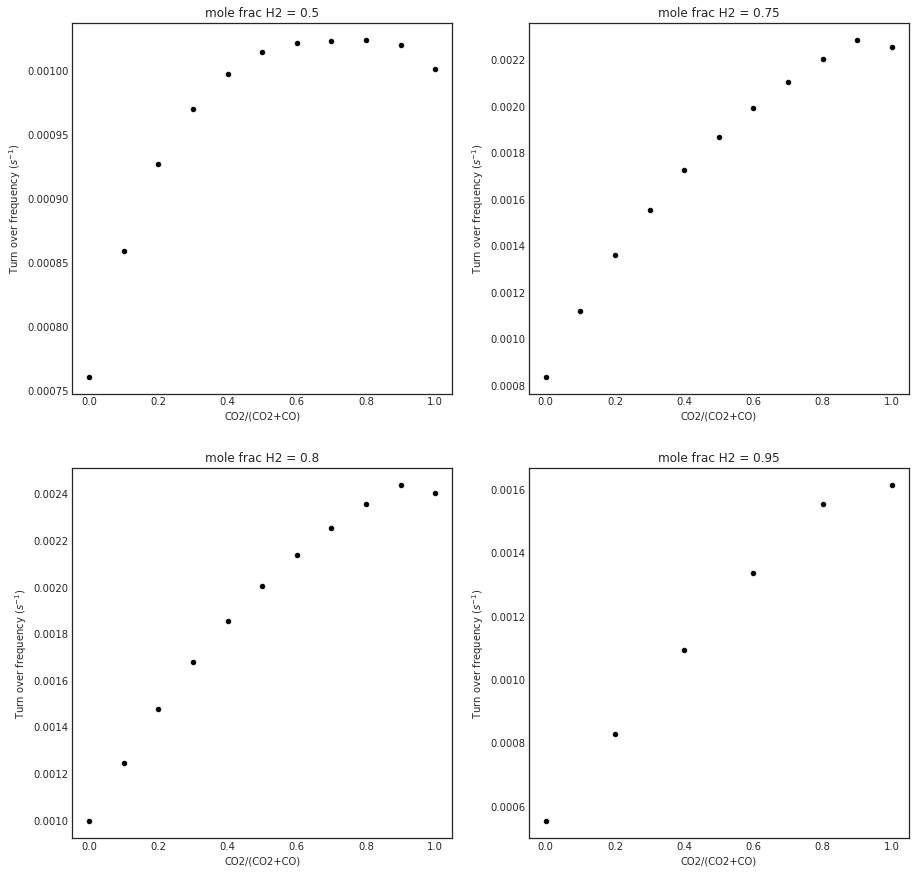

In [19]:
fig_rmg_rates = plot_rates_rmg(data_grab)
fig_rmg_rates

In [28]:
import os
from random import randint
import pandas as pd
import numpy as np
import csv
import cantera as ct
import scipy.io
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.image as mpimg
%matplotlib inline

plt.style.use('seaborn-white')
from pathlib import Path
import time

import matplotlib.cm as cm
from IPython.display import Image

import sys
prefix = '/work/westgroup/ChrisB/_01_MeOH_repos'
sys.path.append( 
    f'{prefix}/uncertainty_analysis/uncertainty_cantera/Spinning_basket_reactor'
)
from sbr import MinSBR
import yaml

In [29]:
model_path

'/scratch/blais.ch/methanol_results_2022_05_09/run_3171'

In [31]:
cti_file_path = f'{model_path}/cantera/chem_annotated.cti'
rmg_model_folder = os.path.dirname(cti_file_path)
csv_path = os.path.join(rmg_model_folder, "ct_analysis.csv")

# generate settings array
settings_yaml = f'{prefix}/uncertainty_analysis/uncertainty_cantera/all_experiments_reorg_sbr.yaml'
with open(settings_yaml, 'r') as f:
    settings = yaml.safe_load(f)

sbr_ss = MinSBR(
    cti_file_path,
    reac_config = settings[190],
    rtol=1.0e-11,
    atol=1.0e-22,
)

In [32]:
settings[111]

{'catalyst_area': 44.424193000339805,
 'experiment_type': 'sbr',
 'expt_name': 'graaf_1988',
 'output': {'CH3OH': 0.003067604974571532, 'H2O': 0.00048632761791987694},
 'pressure': 1500000.0,
 'run_num': 112.0,
 'species': {'CO': 0.12, 'CO2': 0.021, 'H2': 0.859},
 'temperature': 547.8,
 'use_for_opt': False,
 'volume': 0.0001346957850226624,
 'volume_flowrate': 1.196e-05}

In [33]:
sbr_ss.run_reactor_ss_memory()

{'experiment': 'graaf_1988',
 'use_for_opt': True,
 'time (s)': 10051.118521313007,
 'T (K)': 499.3,
 'P (Pa)': 3000000.0,
 'V (m^3/s)': 4.759999999999999e-06,
 'x_CO initial': 0.09200000000000001,
 'x_CO2 initial': 0.105,
 'x_H2 initial': 0.803,
 'x_H2O initial': 0.0,
 'CO2/(CO2+CO)': 0.532994923857868,
 '(CO+CO2/H2)': 0.24533001245330013,
 'T (K) final': 499.3,
 'Rtol': 1e-11,
 'Atol': 1e-22,
 'reactor type': 'IdealGasReactor',
 'energy on?': 'off',
 'catalyst area': 83.5049099558274,
 'graaf MeOH TOF 1/s': 0.0032475268166364084,
 'graaf H2O TOF 1/s': 0.0011247531901521222,
 'RMG MeOH TOF 1/s': 0.00044815895107385334,
 'RMG H2O TOF 1/s': 0.0034389737018363413,
 'error squared MeOH TOF': 0.7430438670829442,
 'error squared H2O TOF': 4.233455605349127,
 'obj_func': 4.976499472432071,
 'log10(RMG/graaf) MeOH TOF': -0.8601206709664865,
 'log10(RMG/graaf) H2O TOF': 0.4853716211084652,
 'log10(RMG/graaf) TOF': -0.18737452492901063,
 'N2': 0.0,
 'Ne': 0.0,
 'H2(2)': 0.7448548822367606,
 'CO

In [34]:
sbr_ss.r.kinetics.net_production_rates

array([ 0.00000000e+00,  0.00000000e+00, -1.28434091e-24, -2.26580123e-20,
        2.80626205e-17, -2.12655492e-20,  1.46816406e-28,  2.12668334e-20,
       -1.39246290e-21, -2.80612292e-17,  2.80626218e-17, -1.07300023e-29,
       -1.34168000e-25,  0.00000000e+00,  0.00000000e+00])

In [35]:
for num, spec in enumerate(sbr_ss.gas.species_names):
    print(spec, ":", sbr_ss.gas[spec].X)

N2 : [0.]
Ne : [0.]
H2(2) : [0.74485488]
CO(3) : [0.0847969]
CO2(4) : [0.09263586]
H2O(5) : [0.04546538]
CH2O(6) : [4.22907385e-08]
HCOOH(7) : [8.41692532e-08]
CH3OH(8) : [0.00592523]
HCOOCH3(9) : [2.5086297e-07]
CH4(24) : [0.02627959]
C2H4O(72) : [9.75263445e-08]
C2H4O2(73) : [4.4412178e-08]
OCCO(126) : [6.44551674e-07]
CCO(170) : [4.09926348e-05]


In [36]:
for num, spec in enumerate(sbr_ss.surf.species_names):
    print(spec, ":", sbr_ss.surf[spec].X)

X(1) : [0.56691612]
H*(10) : [0.00032317]
O*(11) : [1.4071099e-09]
OH*(12) : [1.480153e-12]
H2O*(13) : [0.1879149]
CO*(14) : [0.00050349]
CO2*(15) : [0.0005174]
HCO*(16) : [1.02380712e-07]
HCOO*(17) : [7.59893239e-11]
COOH*(18) : [2.32798921e-13]
HCOOH*(19) : [2.33232134e-11]
CH2O*(20) : [0.00134462]
CH3O*(21) : [6.19215204e-10]
CH3O2*(22) : [7.1489575e-15]
CH3OH*(23) : [0.23955015]
CH3X(35) : [1.32600885e-11]
CH3OX(49) : [5.50370186e-07]
SX(59) : [7.4600064e-13]
SX(62) : [1.69778254e-05]
SX(77) : [5.8519528e-20]
SX(78) : [1.50956568e-14]
C2H3OX(99) : [6.88999941e-08]
SX(102) : [2.97348592e-13]
SX(104) : [1.12520601e-13]
SX(106) : [1.02823634e-14]
SX(107) : [6.54546354e-05]
SX(110) : [1.14238797e-09]
SX(112) : [2.97989363e-05]
SX(113) : [8.0954464e-15]
SX(114) : [7.384148e-12]
SX(115) : [1.06692238e-14]
SX(116) : [5.73140745e-16]
SX(117) : [4.74824564e-15]
SX(123) : [0.00277358]
SX(125) : [4.36096288e-05]
SX(129) : [1.05165086e-11]
SX(133) : [4.77654663e-12]
SX(134) : [4.03737923e-18]


In [37]:
x = dict(zip(sbr_ss.surf.reaction_equations(), sbr_ss.rsurf.kinetics.forward_rates_of_progress))

y = dict(sorted(x.items(), key=lambda kv: kv[-1]))
import collections

sorted_rate = collections.OrderedDict(y)

for equ, rate in sorted_rate.items():
    print(equ, ":", rate )

HCOOH*(19) + SX(77) <=> COOH*(18) + SX(110) : 2.6078722006523094e-38
HCOOH*(19) + SX(77) <=> HCOO*(17) + SX(110) : 2.8382681224382155e-38
OH*(12) + SX(106) <=> O*(11) + SX(77) : 7.311694825012835e-38
2 SX(133) <=> SX(106) + SX(110) : 1.5442540490324675e-37
HCOOH*(19) + SX(153) <=> COOH*(18) + SX(112) : 2.906635264495856e-37
HCOOH*(19) + SX(153) <=> HCOO*(17) + SX(112) : 3.1634258046501657e-37
SX(133) + SX(77) <=> SX(106) + SX(110) : 3.352142304638581e-37
SX(102) + SX(133) <=> SX(106) + SX(110) : 3.389638265639808e-37
2 SX(77) <=> SX(106) + SX(110) : 3.6346152609853366e-37
SX(102) + SX(77) <=> SX(106) + SX(110) : 7.350541743091439e-37
HCOO*(17) + SX(133) <=> HCOOH*(19) + SX(106) : 7.456821997320152e-37
SX(110) + SX(77) <=> SX(102) + SX(110) : 1.3272241746888963e-36
HCOO*(17) + SX(77) <=> HCOOH*(19) + SX(106) : 1.6186668567285066e-36
HCOOH*(19) + SX(134) <=> HCO*(16) + SX(110) : 1.724652001952468e-36
HCOOH*(19) + SX(134) <=> COOH*(18) + SX(107) : 1.7758034095277596e-36
HCOOH*(19) + SX(13

In [38]:
for num, rate in enumerate(sbr_ss.r.kinetics.net_rates_of_progress):
    print(sbr_ss.gas.reaction_equations()[num], ":", rate )

CO(3) + H2(2) <=> CH2O(6) : 1.468164057520153e-28
CO(3) + H2O(5) <=> HCOOH(7) : 2.1265549219538227e-20
CO2(4) + H2(2) <=> HCOOH(7) : 4.280646985501305e-25
CH3OH(8) + CO(3) <=> HCOOCH3(9) : 1.3924628993912472e-21
CH4(24) + CO2(4) <=> HCOOCH3(9) : -2.8062621682767055e-17
CO2(4) + H2(2) <=> HCOOH(7) : 4.280646985501305e-25
CO2(4) + H2(2) <=> HCOOH(7) : 4.280646985501305e-25
CH4(24) + CO(3) <=> C2H4O(72) : -1.0730002312015734e-29
CH4(24) + CO2(4) <=> C2H4O2(73) : -1.341679996473455e-25


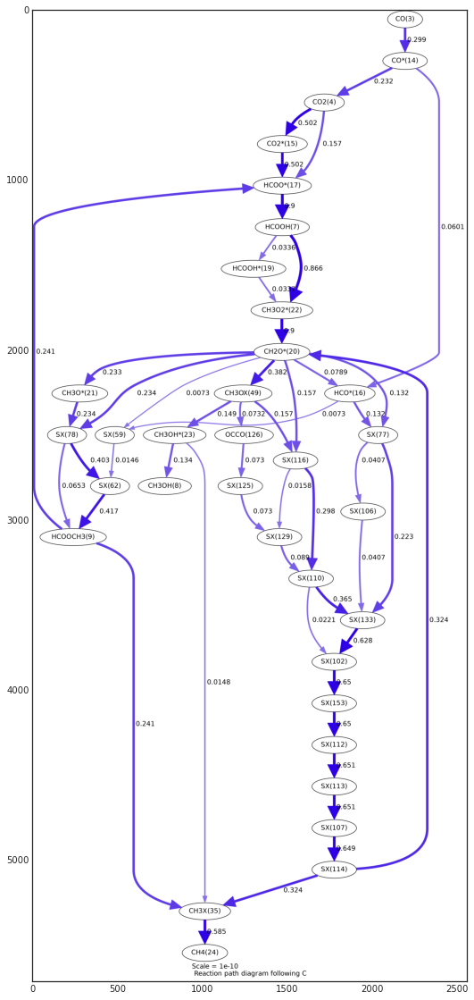

In [41]:
element = 'C'
diagram = ct.ReactionPathDiagram(sbr_ss.surf, element)
diagram.title = 'Reaction path diagram following {0}'.format(element)
diagram.label_threshold = 0.001

dot_file = 'rxnpath.dot'
img_file = 'rxnpath.png'
img_path = Path.cwd().joinpath(img_file)

diagram.write_dot(dot_file)
os.system(f"dot {dot_file} -Tpng -o{img_path} -Gdpi=200")
plt.figure(figsize = (20,20))
image = mpimg.imread(img_path)
plt.imshow(image,aspect='equal')
plt.show()

In [16]:
for num, spec in enumerate(sbr_ss.gas.species_names):
    print(spec, ":", sbr_ss.gas[spec].X)

N2 : [0.]
Ar : [0.]
He : [0.]
Ne : [0.]
H2(2) : [0.43031397]
CO(3) : [1.16694152e-05]
CO2(4) : [0.06956109]
H2O(5) : [0.28987238]
CH2O(6) : [2.80732341e-13]
HCOOH(7) : [1.80512781e-07]
CH3OH(8) : [2.26865617e-09]
HCOOCH3(9) : [2.50154091e-17]
CH4(24) : [0.21020567]
C2H4O(67) : [4.24848887e-12]
C2H4O2(68) : [2.21707581e-11]
CC(131) : [3.50334952e-05]
CCO(137) : [6.09717344e-13]
S(177) : [9.21176626e-16]


In [17]:
for num, spec in enumerate(sbr_ss.surf.species_names):
    print(spec, ":", sbr_ss.surf[spec].X)

X(1) : [0.9528275]
H*(10) : [0.02742341]
O*(11) : [6.34026835e-08]
OH*(12) : [8.69603443e-12]
H2O*(13) : [0.0195099]
CO*(14) : [5.97444013e-05]
CO2*(15) : [6.32609113e-06]
HCO*(16) : [4.65812423e-09]
HCOO*(17) : [2.44375547e-11]
COOH*(18) : [9.19480625e-11]
HCOOH*(19) : [8.41925435e-13]
CH2O*(20) : [8.25281819e-11]
CH3O*(21) : [1.14520532e-15]
CH3O2*(22) : [4.57792142e-19]
CH3OH*(23) : [1.47032765e-09]
CH3X(28) : [1.08442782e-10]
CH3OX(44) : [2.39073463e-10]
CH2OX(52) : [2.42399705e-19]
SX(54) : [8.36838481e-20]
SX(57) : [2.68706155e-17]
SX(72) : [8.29106521e-30]
SX(73) : [1.05486437e-25]
CHOX(76) : [1.71138493e-18]
C2HO2X(93) : [1.95558419e-20]
C2H3OX(95) : [4.80764156e-09]
SX(98) : [8.19917308e-17]
SX(100) : [1.20276391e-17]
SX(103) : [4.7989228e-11]
SX(108) : [2.42157569e-10]
SX(109) : [1.11335348e-18]
SX(110) : [1.03330686e-19]
SX(111) : [3.26363524e-19]
SX(120) : [2.0627477e-19]
C2H6X(127) : [0.00017304]
SX(129) : [6.68755328e-13]
SX(141) : [4.86931018e-20]
SX(147) : [1.31069931e-

In [20]:
prefix = '/Users/blais.ch/_01_code/05_Project_repos_Github/meOH_repos/'
# load file paths
rmg_model_path = f"{prefix}/meOH-synthesis/"

cantera_path = rmg_model_path + "base/cantera/"

data_all = pd.read_csv(cantera_path+ "ct_analysis.csv")
data_graaf = data_all[data_all['experiment'] == "graaf_1988"]
data_grab = data_all[data_all['experiment'] == "grabow2011"]

df_parity = data_graaf[data_graaf["use_for_opt"] == True]

In [19]:
df_parity

,Unnamed: 0,experiment,use_for_opt,time (s),T (K),P (Pa),V (m^3/s),x_CO initial,x_CO2 initial,x_H2 initial,...,CHOX2(64) + HCOOH*(19) <=> CH2OX2(55) + HCOO*(17) ROP [kmol/m^2 s],CHOX2(64) + HCOOH*(19) <=> CH2OX2(55) + COOH*(18) ROP [kmol/m^2 s],CH2OX2(55) + HCOOH*(19) <=> CH3O2*(22) + CHOX2(64) ROP [kmol/m^2 s],CH2O*(20) + CH2OX2(55) <=> CH3O*(21) + CHOX2(64) ROP [kmol/m^2 s],CH3OH*(23) + CHOX2(64) <=> CH2OX2(55) + CH3O*(21) ROP [kmol/m^2 s],CO(3) + H2(2) <=> CH2O(6) ROP [kmol/m^3 s],CO(3) + H2O(5) <=> HCOOH(7) ROP [kmol/m^3 s],CO2(4) + H2(2) <=> HCOOH(7) ROP [kmol/m^3 s],CH3OH(8) + CO(3) <=> HCOOCH3(9) ROP [kmol/m^3 s],CH4(24) + CO2(4) <=> HCOOCH3(9) ROP [kmol/m^3 s]
0,0,graaf_1988,True,5514.178179,483.5,1530000.0,0.000006,0.065,0.261,0.674,...,-5.932729e-39,-5.740502e-39,1.684449e-25,-1.070424e-20,6.311547e-29,5.576216e-36,-4.536857e-24,2.754213e-30,-6.071272e-29,-4.788512e-16
2,2,graaf_1988,True,10196.933673,483.5,3000000.0,0.000006,0.065,0.261,0.674,...,-1.356631e-38,-1.302810e-38,6.559479e-25,-2.935080e-20,2.394330e-28,1.003641e-35,-1.049632e-23,9.018595e-30,-8.924688e-29,-1.620789e-15
3,3,graaf_1988,True,4482.683268,483.5,3000000.0,0.000014,0.065,0.261,0.674,...,-3.124122e-38,-2.997967e-38,1.532120e-24,-6.900240e-20,5.632623e-28,2.363266e-35,-2.449482e-23,2.122466e-29,-2.088673e-28,-1.604389e-15
6,6,graaf_1988,True,5099.154835,499.3,1500000.0,0.000008,0.065,0.261,0.674,...,-3.392573e-38,-3.269580e-38,2.837709e-25,-1.364949e-20,9.309664e-29,9.229260e-35,-3.340191e-23,3.122863e-29,-4.730209e-28,-1.812545e-15
7,7,graaf_1988,True,2534.062706,499.3,1500000.0,0.000016,0.065,0.261,0.674,...,-6.265426e-38,-6.036566e-38,5.267457e-25,-2.559401e-20,1.746139e-28,1.733315e-34,-6.200785e-23,5.824965e-29,-8.857458e-28,-1.801274e-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,195,graaf_1988,True,2395.743484,499.3,2980000.0,0.000047,0.092,0.105,0.803,...,-1.509811e-37,-1.442415e-37,2.354664e-24,-2.099525e-19,2.318909e-27,7.263765e-34,-1.235437e-22,1.986262e-28,-3.199512e-27,-9.395674e-15
197,197,graaf_1988,True,22285.272778,499.3,4990000.0,0.000009,0.092,0.105,0.803,...,-5.662386e-38,-5.370266e-38,1.165755e-24,-6.245531e-20,8.876450e-28,1.892672e-34,-4.860706e-23,1.210942e-28,-5.831271e-28,-1.798052e-14
198,198,graaf_1988,True,6758.697049,499.3,4980000.0,0.000018,0.092,0.105,0.803,...,-1.142815e-37,-1.083619e-37,2.358898e-24,-1.269466e-19,1.802755e-27,3.849229e-34,-9.840880e-23,2.451904e-28,-1.186192e-27,-1.789364e-14
199,199,graaf_1988,True,3781.481582,499.3,5000000.0,0.000028,0.092,0.105,0.803,...,-1.799692e-37,-1.705844e-37,3.738644e-24,-2.010144e-19,2.860497e-27,6.097064e-34,-1.558434e-22,3.904988e-28,-1.869150e-27,-1.792291e-14
